In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")

import os
import glob as gb
import cv2
import tensorflow as tf
import keras

In [ ]:
!gdown https://drive.google.com/uc?id=1Qc66kVqetwJIK7cKXnXxbPJy6gnpRSRI
!unzip The_Data.zip

Downloading...
From: https://drive.google.com/uc?id=1Qc66kVqetwJIK7cKXnXxbPJy6gnpRSRI
To: /content/The_Data.zip
363MB [00:02, 146MB/s]
Archive:  The_Data.zip
replace seg_pred/seg_pred/10004.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
######### YOUR CODE HERE #########
trainpath = './seg_train/'
testpath = './seg_test/'
predpath = './seg_pred/'

##################################

In [ ]:
for folder in  os.listdir(trainpath + 'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2271 in folder forest
For training data , found 2382 in folder street
For training data , found 2191 in folder buildings
For training data , found 2274 in folder sea
For training data , found 2512 in folder mountain
For training data , found 2404 in folder glacier


In [ ]:
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 474 in folder forest
For testing data , found 501 in folder street
For testing data , found 437 in folder buildings
For testing data , found 510 in folder sea
For testing data , found 525 in folder mountain
For testing data , found 553 in folder glacier


In [ ]:
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


In [ ]:
code_to_num = {'buildings':0 ,'forest':1, 'glacier':2, 'mountain':3, 'sea':4, 'street':5}
num_to_code = {0:'buildings' ,1:'forest', 2:'glacier', 3:'mountain', 4:'sea', 5:'street'}

def get_code(n) :
    if n in num_to_code:
        return num_to_code[n]

def get_num(c):
    if c in code_to_num:
        return code_to_num[c]

In [ ]:
size = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    13986
(113, 150, 3)        7
(135, 150, 3)        3
(111, 150, 3)        3
(123, 150, 3)        2
(142, 150, 3)        2
(144, 150, 3)        2
(108, 150, 3)        2
(134, 150, 3)        2
(146, 150, 3)        2
(143, 150, 3)        2
(136, 150, 3)        2
(119, 150, 3)        1
(133, 150, 3)        1
(100, 150, 3)        1
(140, 150, 3)        1
(131, 150, 3)        1
(149, 150, 3)        1
(105, 150, 3)        1
(141, 150, 3)        1
(115, 150, 3)        1
(76, 150, 3)         1
(110, 150, 3)        1
(120, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
(103, 150, 3)        1
(145, 150, 3)        1
(81, 150, 3)         1
(124, 150, 3)        1
(97, 150, 3)         1
dtype: int64

In [ ]:
size = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    2993
(72, 150, 3)        1
(110, 150, 3)       1
(76, 150, 3)        1
(141, 150, 3)       1
(81, 150, 3)        1
(149, 150, 3)       1
(131, 150, 3)       1
dtype: int64

In [ ]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(100, 150, 3)       1
(124, 150, 3)       1
(133, 150, 3)       1
(139, 150, 3)       1
(112, 150, 3)       1
(129, 150, 3)       1
(374, 500, 3)       1
(144, 150, 3)       1
(108, 150, 3)       1
(126, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(131, 150, 3)       1
dtype: int64

In [ ]:
s = 100

In [ ]:

X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(get_num(folder))

In [ ]:
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


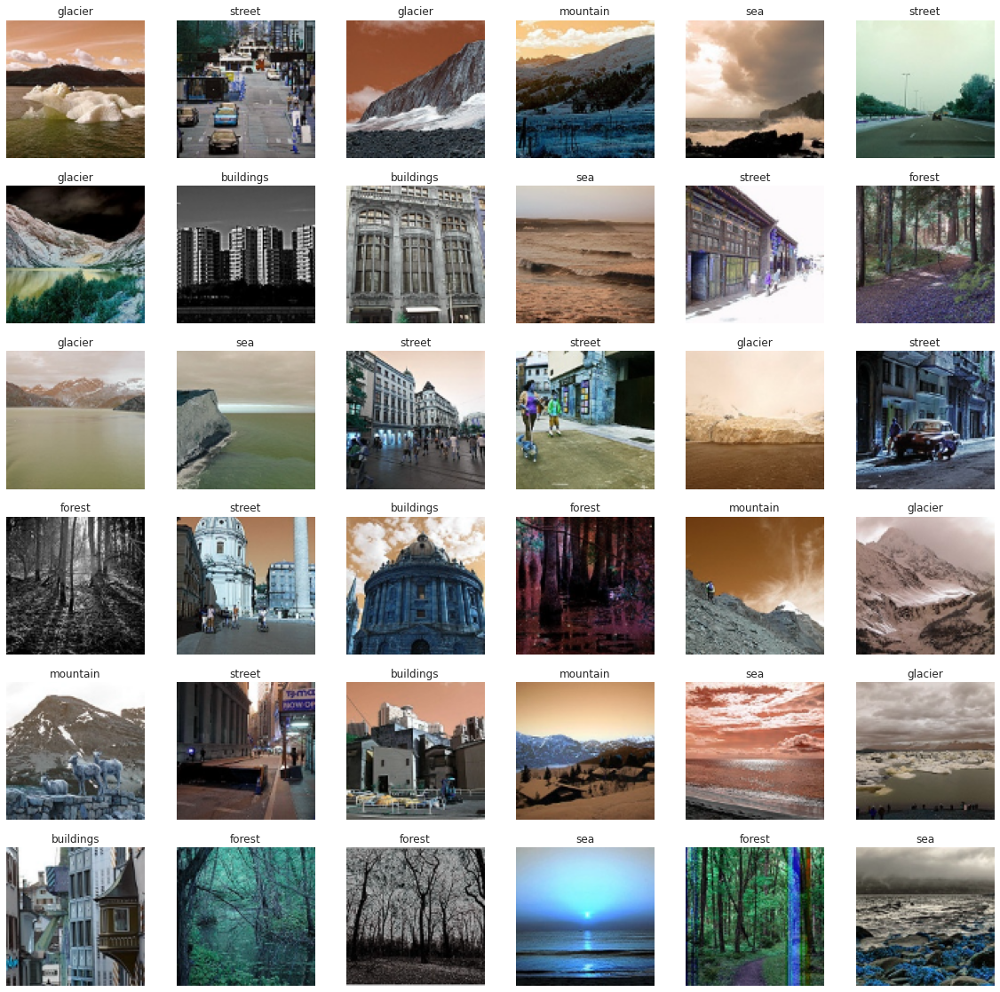

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(get_code(y_train[i]))

In [ ]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(get_num(folder))


In [ ]:
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


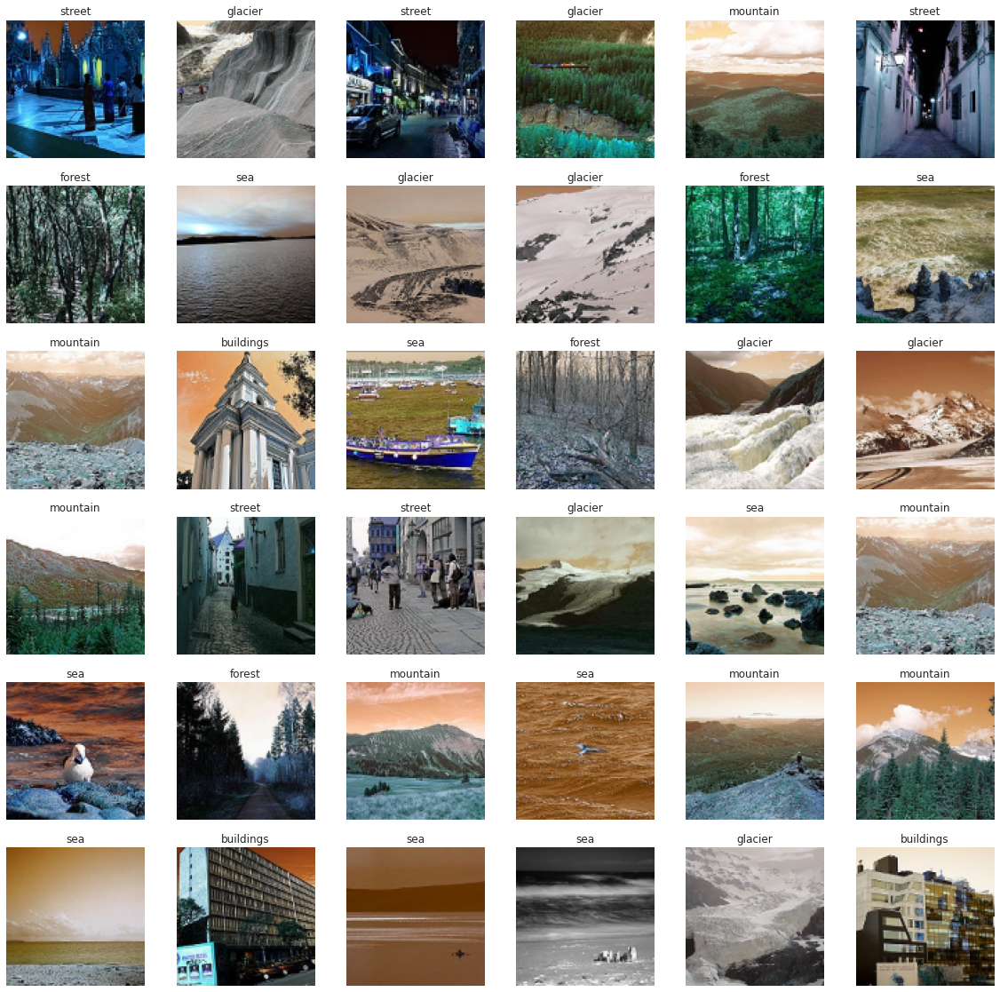

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(get_code(y_test[i]))

In [ ]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [ ]:
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


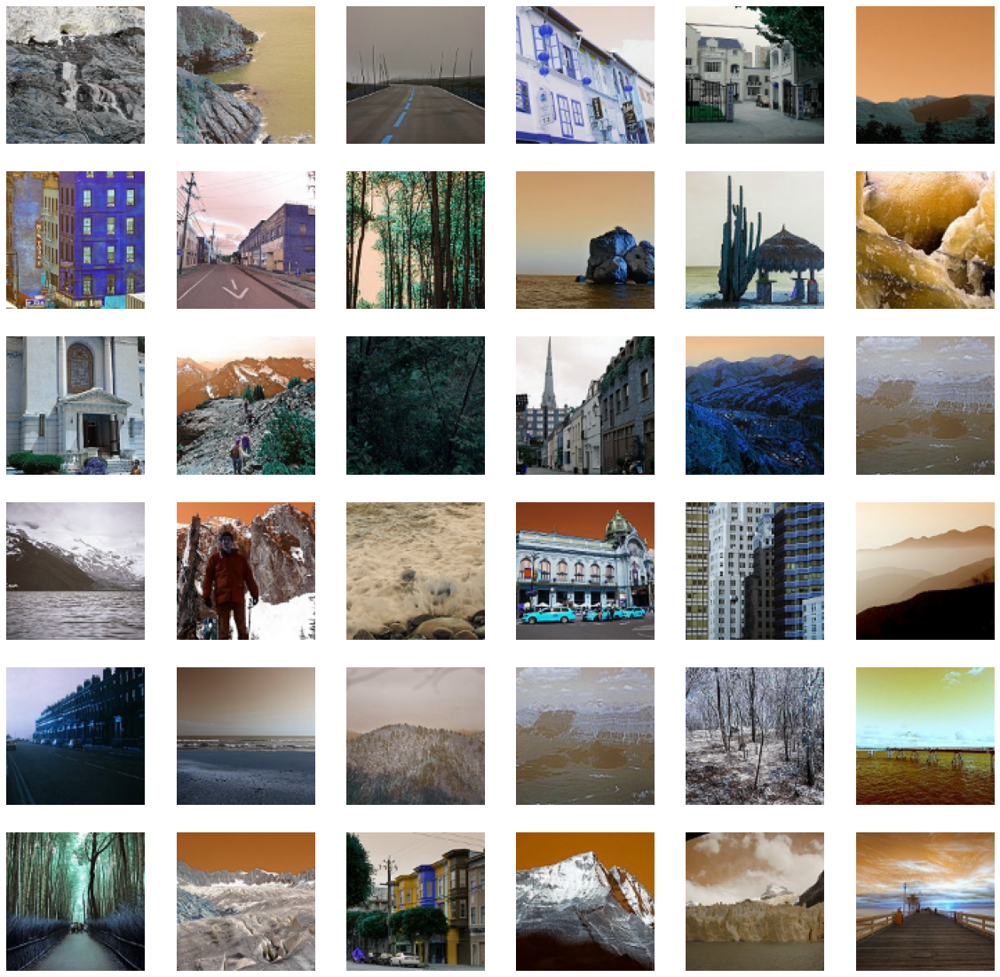

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [ ]:
############### YOUR CODE HERE  ####################
KerasModel = keras.models.Sequential([
  keras.layers.Conv2D(filters=64,kernel_size=(2,2), activation='relu',padding="same", input_shape=(100, 100, 3)),

   keras.layers.MaxPooling2D((2,2),strides=(2,2)),






   keras.layers.Conv2D(filters=128, kernel_size=(2,2), padding="same",activation='relu'),

   keras.layers.MaxPooling2D((2,2),strides=(2,2)),



   keras.layers.Conv2D(filters=256, kernel_size=(2,2), padding="same",activation='relu'),

   keras.layers.MaxPooling2D((2,2),strides=(2,2)),




   keras.layers.Conv2D(filters=512, kernel_size=(2,2), padding="same",activation='relu'),

   keras.layers.MaxPooling2D((2,2),strides=(2,2)),





   keras.layers.Flatten(),




   keras.layers.Dense(128, activation='relu'),

   keras.layers.Dropout(0.5),

   keras.layers.Dense(6, activation='softmax')
]
)
####################################################

In [ ]:
############### YOUR CODE HERE  ####################
KerasModel.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])






####################################################

In [ ]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 100, 100, 64)      832       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 50, 50, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 50, 50, 128)       32896     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 25, 25, 128)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 25, 25, 256)       131328    
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 12, 12, 256)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (Non

Now to train the model , lets use 50 epochs now

In [ ]:
############### YOUR CODE HERE  ####################
ThisModel = KerasModel.fit(X_train , y_train , epochs=50)

####################################################

Epoch 1/50
439/439 [==============================] - 13s 30ms/step - loss: 1.5324 - accuracy: 0.3684
Epoch 2/50
439/439 [==============================] - 13s 30ms/step - loss: 1.0932 - accuracy: 0.5596
Epoch 3/50
439/439 [==============================] - 13s 30ms/step - loss: 0.9690 - accuracy: 0.6201
Epoch 4/50
439/439 [==============================] - 13s 30ms/step - loss: 0.8540 - accuracy: 0.6794
Epoch 5/50
439/439 [==============================] - 13s 30ms/step - loss: 0.7448 - accuracy: 0.7272
Epoch 6/50
439/439 [==============================] - 13s 30ms/step - loss: 0.6732 - accuracy: 0.7589
Epoch 7/50
439/439 [==============================] - 13s 30ms/step - loss: 0.6191 - accuracy: 0.7813
Epoch 8/50
439/439 [==============================] - 13s 30ms/step - loss: 0.5691 - accuracy: 0.8015
Epoch 9/50
439/439 [==============================] - 13s 30ms/step - loss: 0.5242 - accuracy: 0.8177
Epoch 10/50
439/439 [==============================] - 13s 30ms/step - loss: 0.469

How is the final loss & accuracy?


In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 1s 11ms/step - loss: 1.2206 - accuracy: 0.8373
Test Loss is 1.2206047773361206
Test Accuracy is 0.8373333215713501


In [ ]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

Prediction Shape is (3000, 6)


In [ ]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

Prediction Shape is (7301, 6)


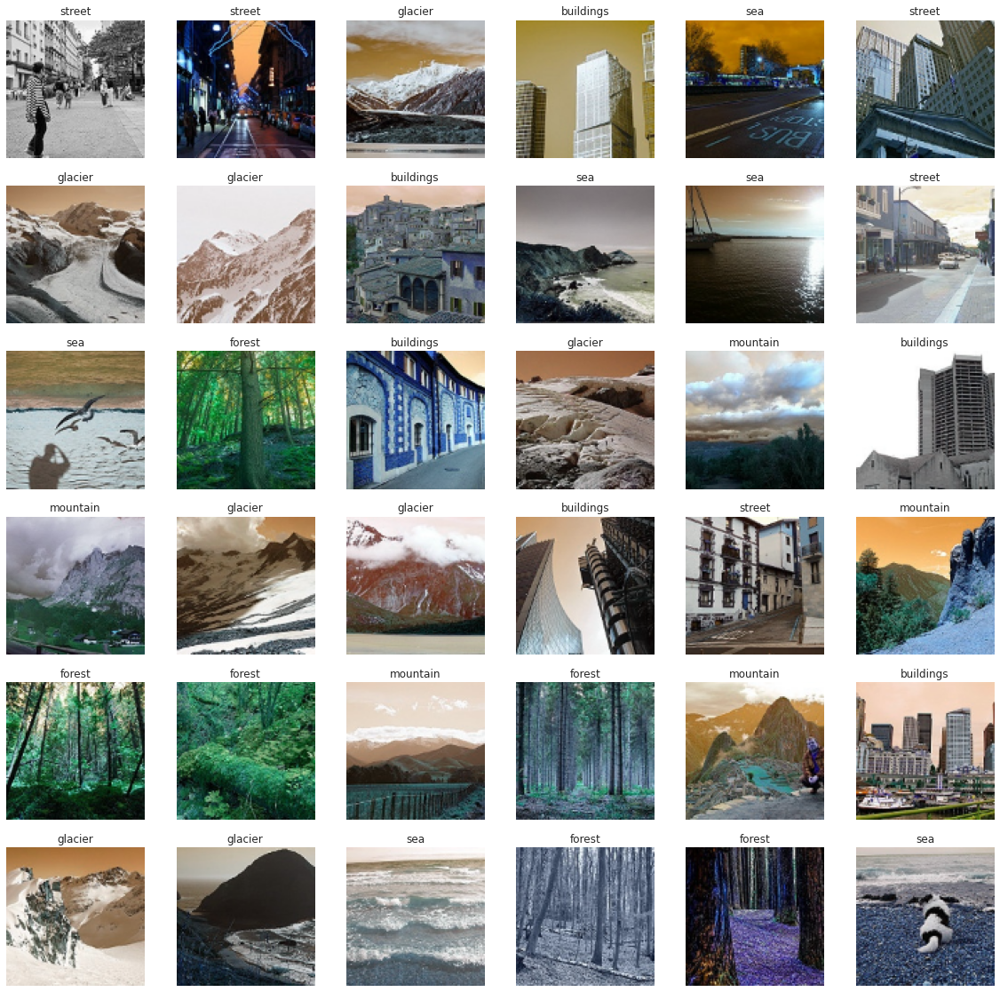

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')
    plt.title(get_code(np.argmax(y_result[i])))

In [ ]:
#### BONUS POINTS FOR SOME TRANSFER LEARNING APPROACH

In [ ]:
s = 224

X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(get_num(folder))

print(f'we have {len(X_train)} items in X_train')


X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(get_num(folder))

print(f'we have {len(X_test)} items in X_test')


X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))


print(f'we have {len(X_pred)} items in X_pred')

X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')


we have 14034 items in X_train
we have 3000 items in X_test
we have 7301 items in X_pred
X_train shape  is (14034, 224, 224, 3)
X_test shape  is (3000, 224, 224, 3)
X_pred shape  is (7301, 224, 224, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [ ]:
model = tf.keras.applications.MobileNetV3Small(
    input_shape=(s,s,3), alpha=1.0, minimalistic=False, include_top=True,
    weights='imagenet', input_tensor=None, classes=1000, pooling=None,
    dropout_rate=0.2, classifier_activation='softmax'
)

base_inputs = model.layers[0].input
base_outputs = model.layers[-2].output
final_outputs =  keras.layers.Dense(6, activation='softmax')(base_outputs)


model2 = keras.Model(inputs=base_inputs,outputs= final_outputs)


print('Model Details are : ')
print(model2.summary())




10739712/10734624 [==============================] - 0s 0us/step
Model Details are : 
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv (Conv2D)                   (None, 112, 112, 16) 432         rescaling[0][0]                  
__________________________________________________________________________________________________
Conv/BatchNorm (BatchNormalizat (None, 112, 112, 16) 64          Conv[0][0]                       
________

In [ ]:
model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model2.fit(X_train , y_train , epochs=5)



Epoch 1/5
439/439 [==============================] - 67s 67ms/step - loss: 1.2633 - accuracy: 0.7811
Epoch 2/5
439/439 [==============================] - 29s 65ms/step - loss: 0.2377 - accuracy: 0.9176
Epoch 3/5
439/439 [==============================] - 29s 66ms/step - loss: 0.1782 - accuracy: 0.9408
Epoch 4/5
439/439 [==============================] - 29s 66ms/step - loss: 0.1634 - accuracy: 0.9444
Epoch 5/5
439/439 [==============================] - 29s 66ms/step - loss: 0.1331 - accuracy: 0.9532


In [ ]:
model.trainable=False

print('Model Details are : ')
print(model2.summary())


Model Details are : 
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv (Conv2D)                   (None, 112, 112, 16) 432         rescaling[0][0]                  
__________________________________________________________________________________________________
Conv/BatchNorm (BatchNormalizat (None, 112, 112, 16) 64          Conv[0][0]                       
_________________________________________________________________________

In [ ]:
model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model2.fit(X_train , y_train , epochs=5)

Epoch 1/5
439/439 [==============================] - 11s 18ms/step - loss: 0.1558 - accuracy: 0.9464
Epoch 2/5
439/439 [==============================] - 8s 18ms/step - loss: 0.0968 - accuracy: 0.9663
Epoch 3/5
439/439 [==============================] - 8s 18ms/step - loss: 0.0860 - accuracy: 0.9677
Epoch 4/5
439/439 [==============================] - 8s 18ms/step - loss: 0.0795 - accuracy: 0.9713
Epoch 5/5
439/439 [==============================] - 8s 18ms/step - loss: 0.0786 - accuracy: 0.9728


In [ ]:
ModelLoss, ModelAccuracy = model2.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

94/94 [==============================] - 3s 22ms/step - loss: 0.3075 - accuracy: 0.9123
Test Loss is 0.3074755370616913
Test Accuracy is 0.9123333096504211


Prediction Shape is (3000, 6)
Prediction Shape is (7301, 6)


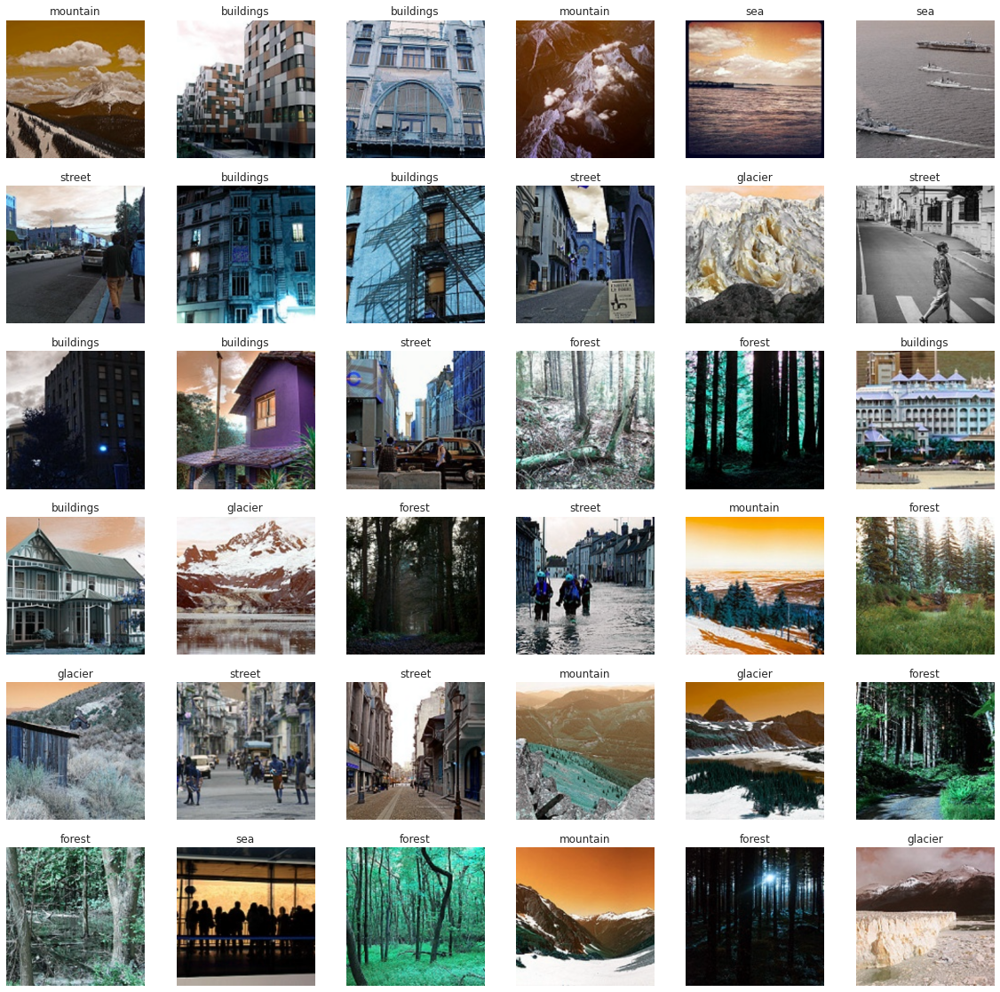

In [ ]:
y_pred = model2.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

y_result = model2.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))



plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')
    plt.title(get_code(np.argmax(y_result[i])))



